# EE551 
## Image Filtering: Image Enhancements using Derivatives 

### Import libraries

In [1]:
%matplotlib inline
import numpy as np
from scipy import signal, misc, ndimage
from skimage import filters, feature, img_as_float
from skimage.io import imread
from skimage.color import rgb2gray
from PIL import Image, ImageFilter
import matplotlib.pylab as pylab

### Derivatives and gradients

C:\Users\0109491s\AppData\Local\Temp/ipykernel_13736/2044764259.py:10: RuntimeWarning: divide by zero encountered in divide
  im_dir = np.arctan(im_y/im_x)
C:\Users\0109491s\AppData\Local\Temp/ipykernel_13736/2044764259.py:10: RuntimeWarning: invalid value encountered in divide
  im_dir = np.arctan(im_y/im_x)


<Figure size 432x288 with 0 Axes>

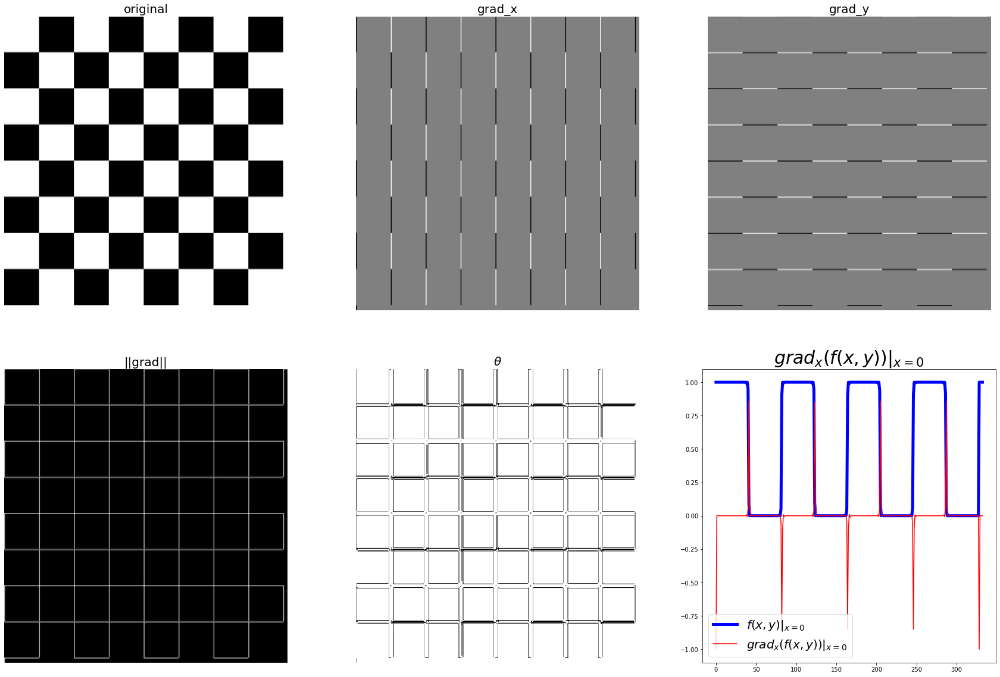

In [6]:
def plot_image(image, title):
    pylab.imshow(image), pylab.title(title, size=20), pylab.axis('off')
    
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../images/chess.bmp'))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_dir = np.arctan(im_y/im_x)
pylab.gray()
pylab.figure(figsize=(30,20))
pylab.subplot(231), plot_image(im, 'original'), pylab.subplot(232),
plot_image(im_x, 'grad_x')
pylab.subplot(233), plot_image(im_y, 'grad_y'), pylab.subplot(234),
plot_image(im_mag, '||grad||')
pylab.subplot(235), plot_image(im_dir, r'$\theta$'), pylab.subplot(236)
pylab.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
pylab.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
pylab.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
pylab.legend(prop={'size': 20})
pylab.show()

### Displaying the magnitude and the gradient on the same image

1.0


C:\Users\0109491s\AppData\Local\Temp/ipykernel_13736/1149330141.py:17: RuntimeWarning: divide by zero encountered in divide
  im_ang = np.arctan(im_y/im_x)
C:\Users\0109491s\AppData\Local\Temp/ipykernel_13736/1149330141.py:17: RuntimeWarning: invalid value encountered in divide
  im_ang = np.arctan(im_y/im_x)


<Figure size 432x288 with 0 Axes>

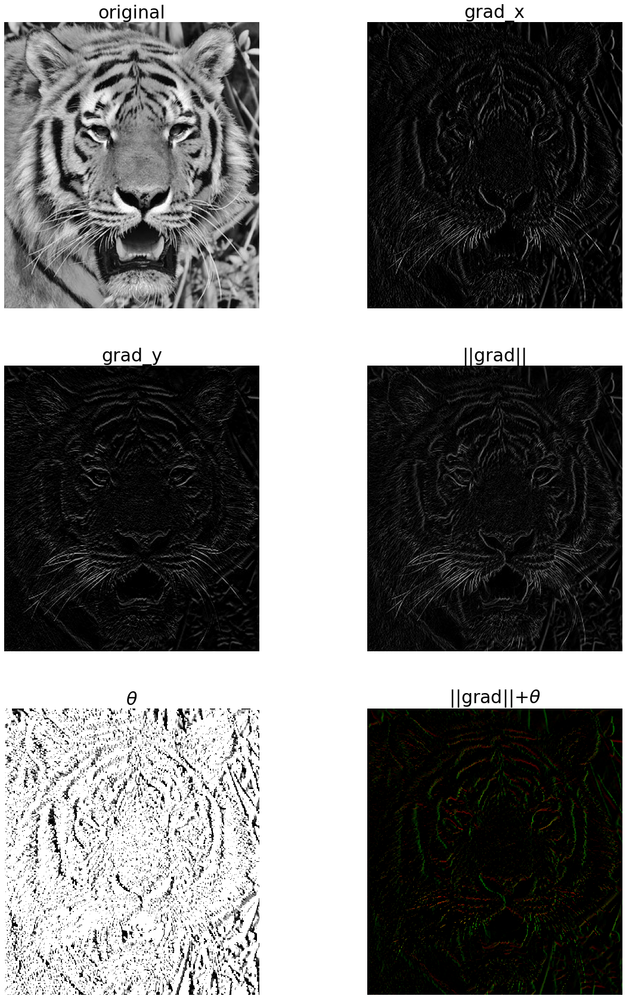

In [3]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import random_noise
from skimage.filters import gaussian
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../images/tiger3.jpg'))
#im = random_noise(im, var=sigma**2)
#im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'),0,1)
im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'),0,1)
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(20,30))
plt.subplot(321)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(322)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(323)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(324)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(325)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(326)
im = np.zeros((im.shape[0],im.shape[1],3))
im[...,0] = im_mag*np.sin(im_ang)
im[...,1] = im_mag*np.cos(im_ang)
plt.imshow(im)
plt.title(r'||grad||+$\theta$', size=30)
plt.axis('off')
plt.show()

### Laplacian

C:\Users\0109491s\AppData\Local\Temp/ipykernel_4148/750595834.py:2: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  im = rgb2gray(imread('../images/chess.png'))


<Figure size 432x288 with 0 Axes>

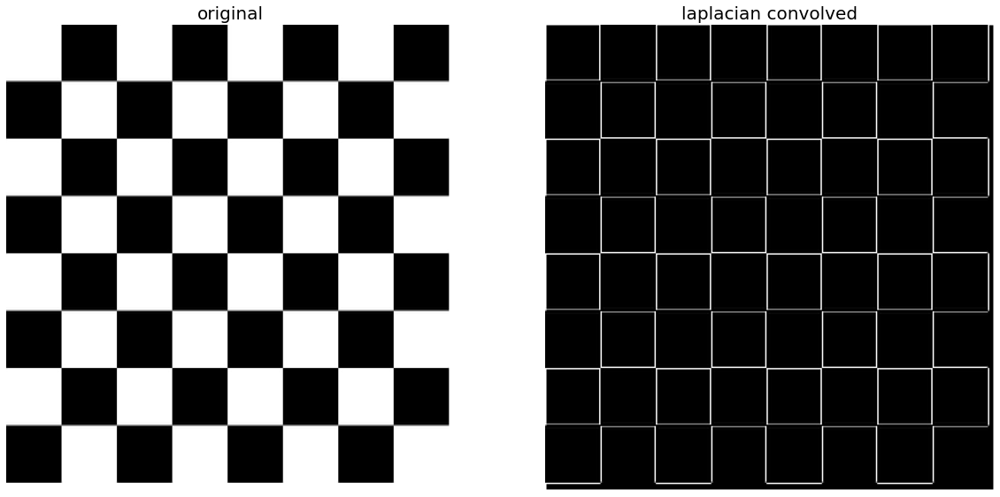

In [5]:
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread('../images/chess.png'))
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(121), plot_image(im, 'original')
pylab.subplot(122), plot_image(im1, 'laplacian convolved')
pylab.show()

### Effects of noise on gradient computation

1.0000000000000004


C:\Users\0109491s\AppData\Local\Temp/ipykernel_4148/629258172.py:10: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  im = rgb2gray(imread('../images/chess.png'))
C:\Users\0109491s\AppData\Local\Temp/ipykernel_4148/629258172.py:21: RuntimeWarning: divide by zero encountered in true_divide
  im_ang = np.arctan(im_y/im_x)
C:\Users\0109491s\AppData\Local\Temp/ipykernel_4148/629258172.py:21: RuntimeWarning: invalid value encountered in true_divide
  im_ang = np.arctan(im_y/im_x)


<Figure size 432x288 with 0 Axes>

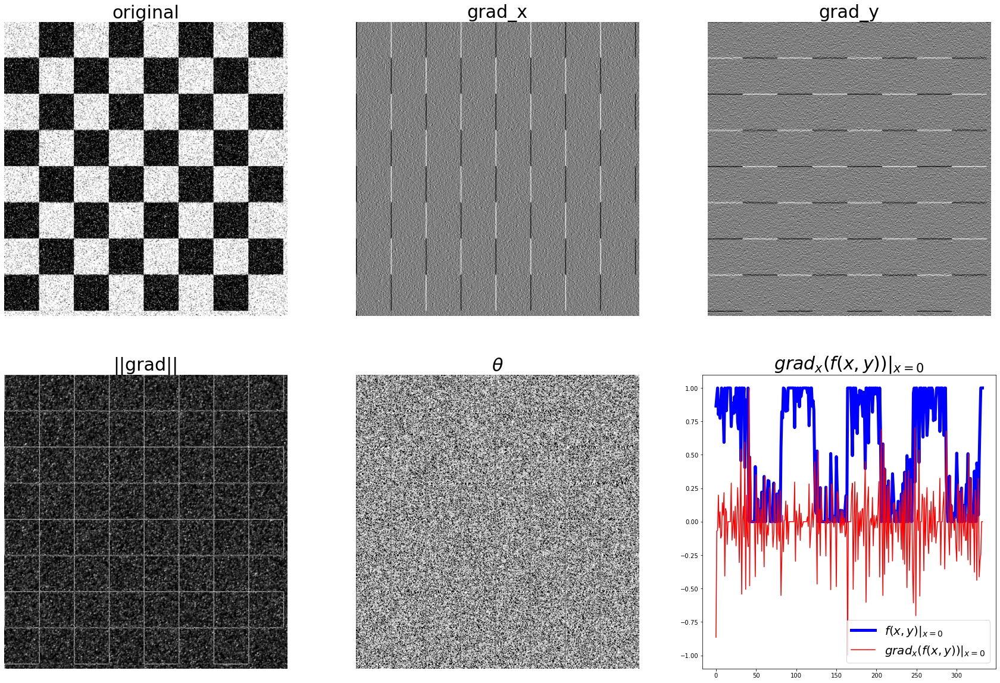

In [6]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import random_noise
from skimage.filters import gaussian
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../images/chess.png'))
sigma = 0.25
sign = np.random.random(im.shape)
sign[sign <= 0.5] = -1
sign[sign > 0.5] = 1
im = random_noise(im, var=sigma**2)
im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(30,20))
plt.subplot(231)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(232)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(233)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(234)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(235)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(236)
plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
plt.legend(prop={'size': 20})
plt.show()

### Sharpening with Laplacian

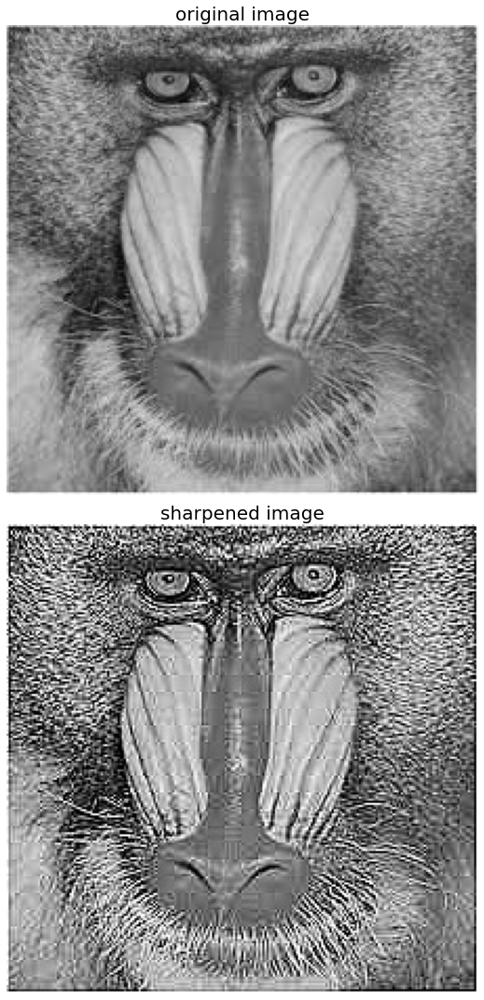

In [7]:
from skimage.filters import laplace
im = rgb2gray(imread('../images/mandrill.jpg'))
im1 = np.clip(laplace(im) + im, 0, 1)
pylab.figure(figsize=(10,15))
pylab.subplot(211), plot_image(im, 'original image')
pylab.subplot(212), plot_image(im1, 'sharpened image')
pylab.tight_layout()
pylab.show()

### Unsharp masking

<Figure size 432x288 with 0 Axes>

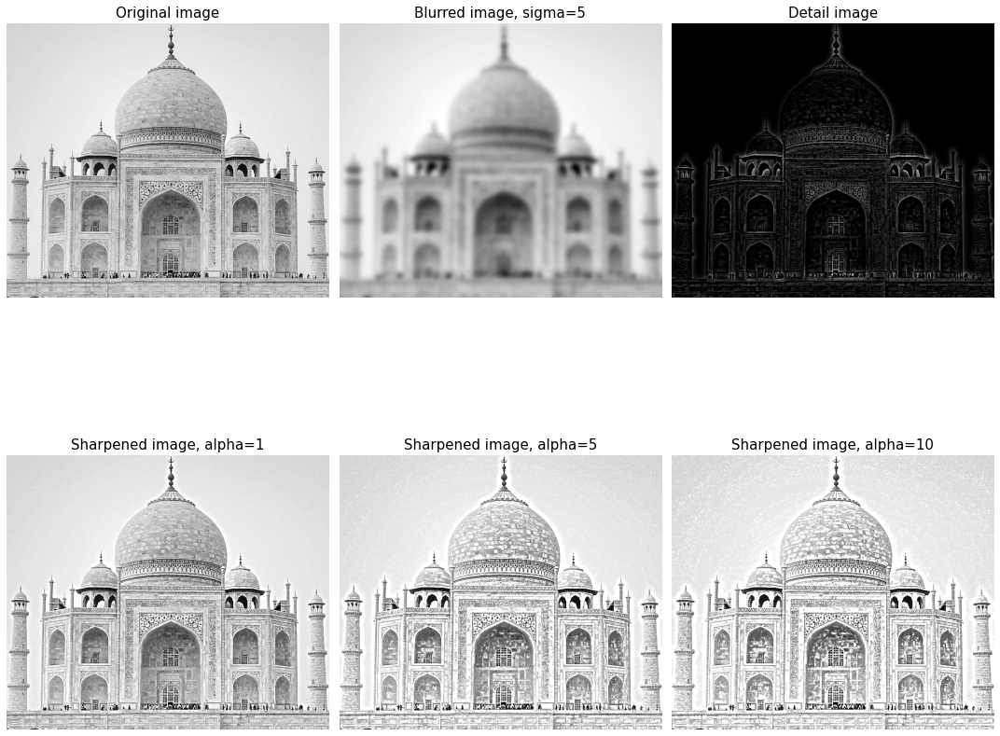

In [13]:
def rgb2gray(im):
    '''
    the input image is an RGB image
    with pixel values for each channel in [0,1]
    '''
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

im = rgb2gray(img_as_float(imread('../images/tajmahal1.jpg')))
im_blurred = ndimage.gaussian_filter(im, 5)
im_detail = np.clip(im - im_blurred, 0, 1)
pylab.gray()
fig, axes = pylab.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(15, 15))
axes = axes.ravel()
axes[0].set_title('Original image', size=15), axes[0].imshow(im)
axes[1].set_title('Blurred image, sigma=5', size=15),
axes[1].imshow(im_blurred)
axes[2].set_title('Detail image', size=15), axes[2].imshow(im_detail)
alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp), axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)
for ax in axes:
    ax.axis('off')
fig.tight_layout()
pylab.show()

### Sobel edge detector with scikit-image

<Figure size 432x288 with 0 Axes>

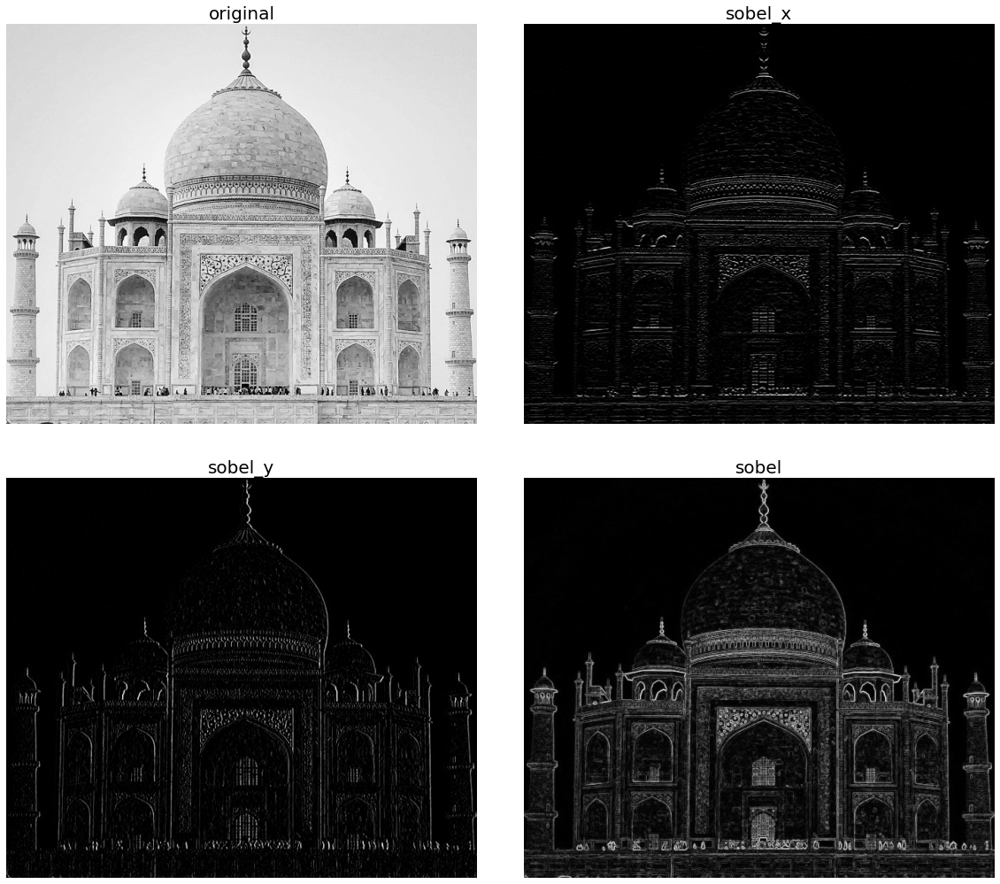

In [16]:
im = rgb2gray(img_as_float(imread('../images/tajmahal1.jpg')))
pylab.gray()
pylab.figure(figsize=(20,18))
pylab.subplot(2,2,1)
plot_image(im, 'original')
pylab.subplot(2,2,2)
edges_x = filters.sobel_h(im)
plot_image(np.clip(edges_x,0,1), 'sobel_x')
pylab.subplot(2,2,3)
edges_y = filters.sobel_v(im)
plot_image(np.clip(edges_y,0,1), 'sobel_y')
pylab.subplot(2,2,4)
edges = filters.sobel(im)
plot_image(np.clip(edges,0,1), 'sobel')
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

### Different edge detectors with scikit-image – Prewitt, Roberts, Sobel, Scharr, and Laplace

<Figure size 432x288 with 0 Axes>

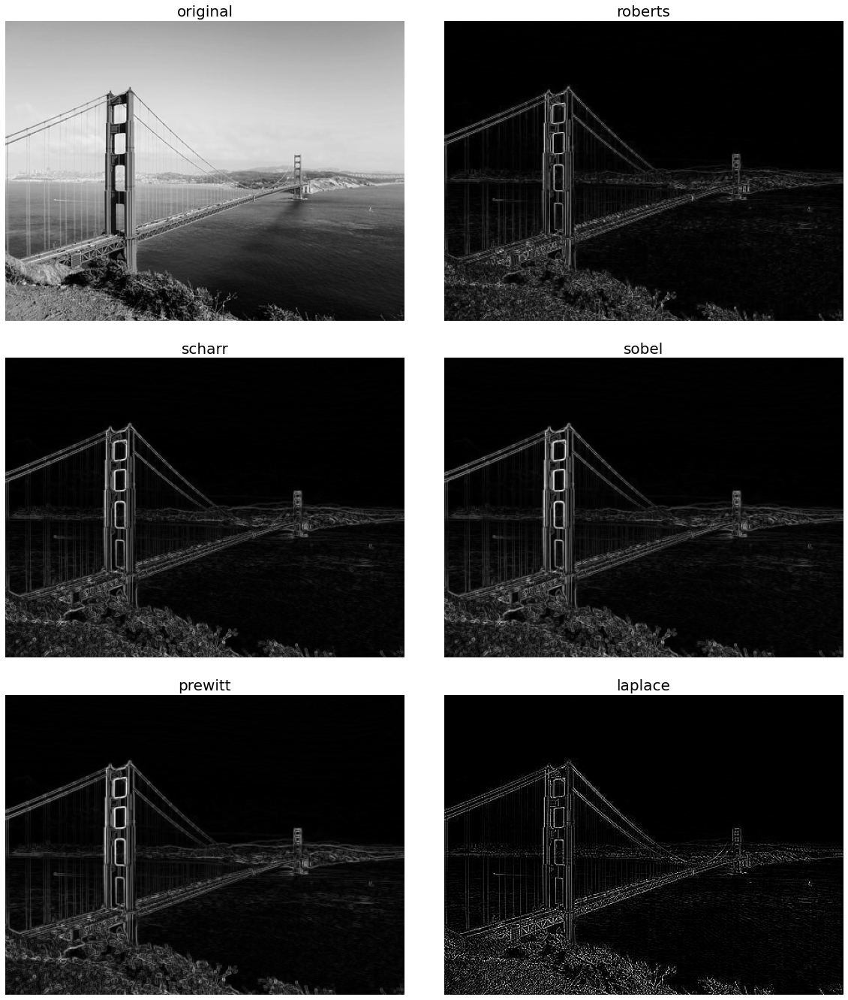

In [19]:
im = rgb2gray(img_as_float(imread('../images/goldengate.jpg')))
pylab.gray()
pylab.figure(figsize=(20,24))
pylab.subplot(3,2,1), plot_image(im, 'original')
edges = filters.roberts(im)
pylab.subplot(3,2,2), plot_image(edges, 'roberts')
edges = filters.scharr(im)
pylab.subplot(3,2,3), plot_image(edges, 'scharr')
edges = filters.sobel(im)
pylab.subplot(3,2,4), plot_image(edges, 'sobel')
edges = filters.prewitt(im)
pylab.subplot(3,2,5), plot_image(edges, 'prewitt')
edges = np.clip(filters.laplace(im), 0, 1)
pylab.subplot(3,2,6), plot_image(edges, 'laplace')
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

### The Canny edge detector with scikit-image

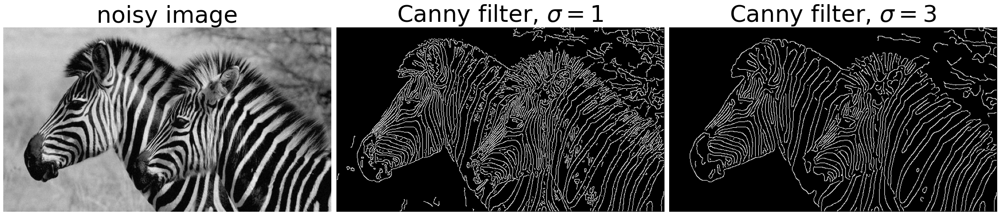

In [11]:

im = rgb2gray(img_as_float(imread('../images/zebras.jpg')))
#im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=2)
fig, (axes1, axes2, axes3) = pylab.subplots(nrows=1, ncols=3, figsize=(30,
12), sharex=True, sharey=True)
axes1.imshow(im, cmap=pylab.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=50)
axes2.imshow(edges1, cmap=pylab.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=50)
axes3.imshow(edges2, cmap=pylab.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=50)
fig.tight_layout()
pylab.show()

### The LoG and DoG filters

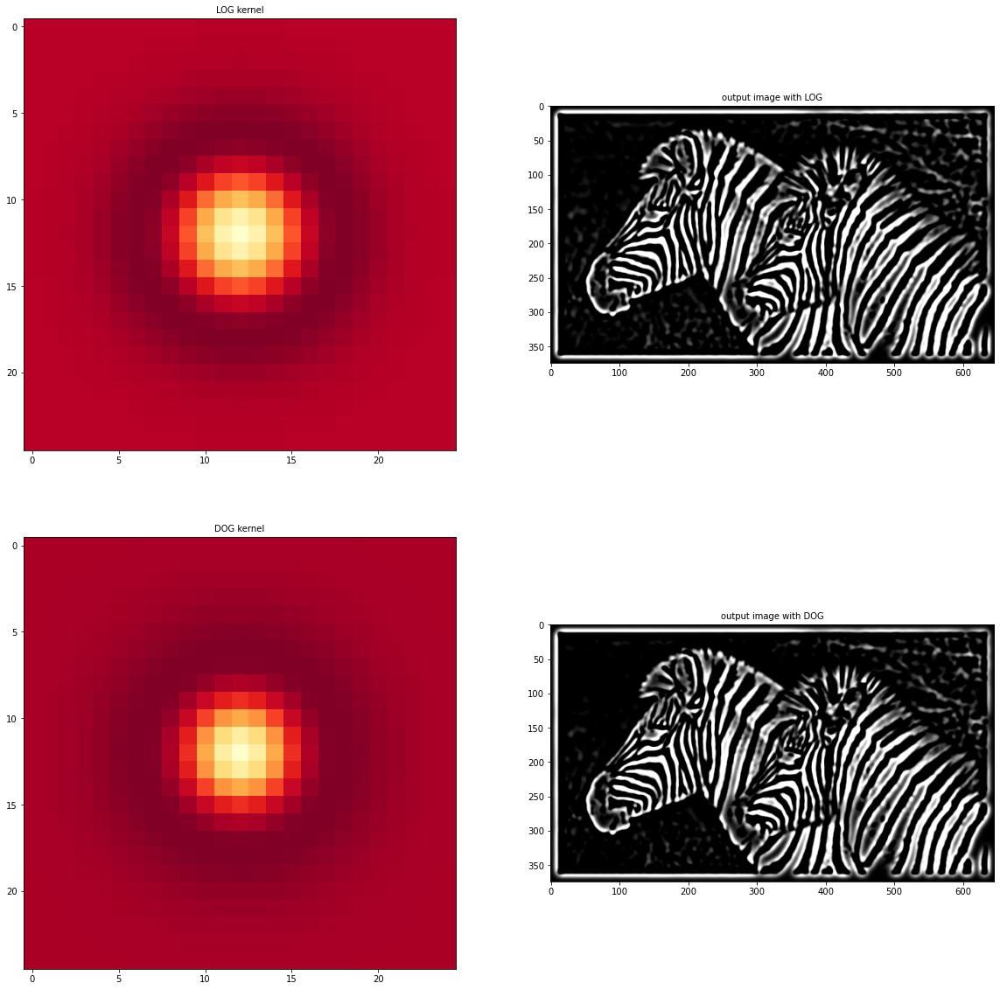

In [10]:
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from numpy import pi

def plot_kernel(kernel, s, name):
    pylab.imshow(kernel, cmap='YlOrRd')

def LOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = -(1-((i-k)**2+(j-k)**2)/(2.*s**2))*np.exp(-((i-k)**2+(j-k)**2)/(2.*s**2))/(pi*s**4)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

def DOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    s1, s2 = s * np.sqrt(2), s / np.sqrt(2)
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = np.exp(-((i-k)**2+(j-k)**2)/(2.*s1**2))/(2*pi*s1**2) - np.exp(-((i-k)**2+(j-k)**2)/(2.*s2**2))/(2*pi*s2**2)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

s = 3 # sigma value for LoG
im = rgb2gray(img_as_float(imread('../images/zebras.jpg')))
kernel = LOG()
outimg = convolve2d(im, kernel)
pylab.figure(figsize=(20,20))
pylab.subplot(221), pylab.title('LOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
pylab.subplot(222), pylab.title('output image with LOG', size=20)
pylab.imshow(np.clip(outimg,0,1), cmap='gray') # clip the pixel values in between 0 and 1
kernel = DOG()
outimg = convolve2d(im, DOG())
pylab.subplot(223), pylab.title('DOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
pylab.subplot(224), pylab.title('output image with DOG', size=20)
pylab.imshow(np.clip(outimg,0,1), cmap='gray')
pylab.show()    

### The LoG filter with the SciPy ndimage module

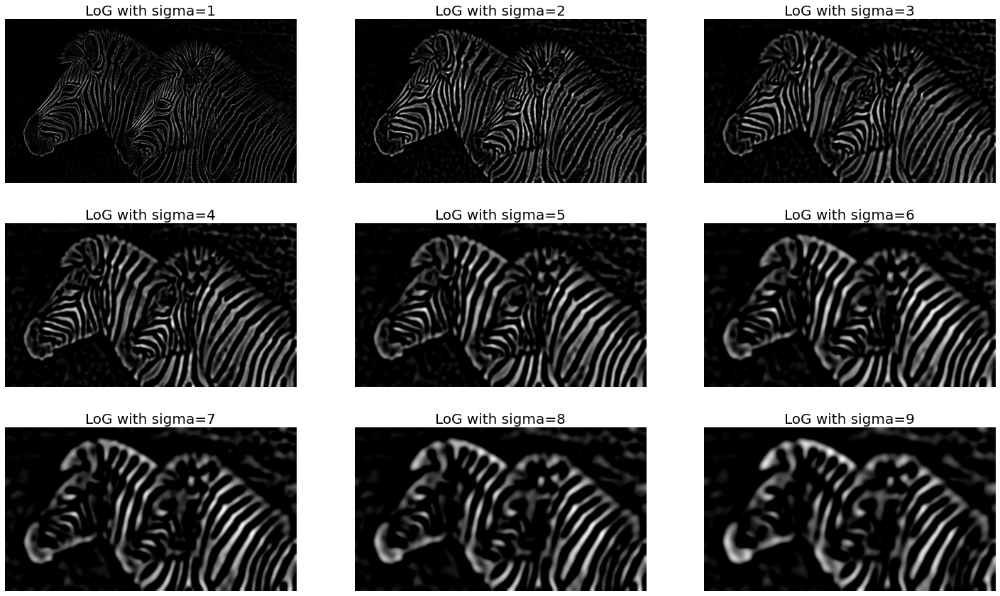

In [30]:
img = rgb2gray(img_as_float(imread('../images/zebras.jpg')))
fig = pylab.figure(figsize=(25,15))
pylab.gray() # show the filtered result in grayscale
for sigma in range(1,10):
    pylab.subplot(3,3,sigma)
    img_log = ndimage.gaussian_laplace(img, sigma=sigma)
    pylab.imshow(np.clip(img_log,0,1)), pylab.axis('off')
    pylab.title('LoG with sigma=' + str(sigma), size=20)
pylab.show()

## LoG vs Canny comparison

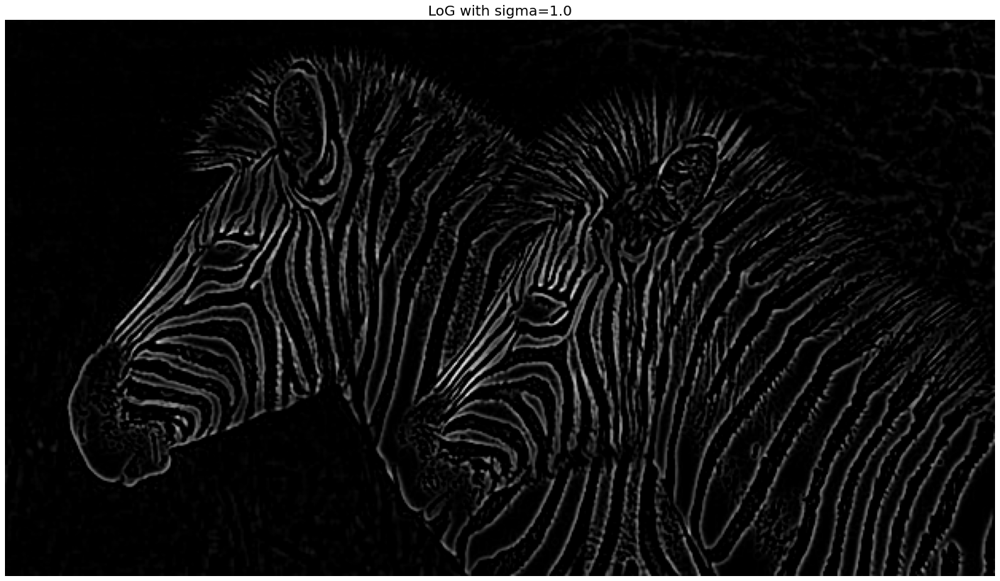

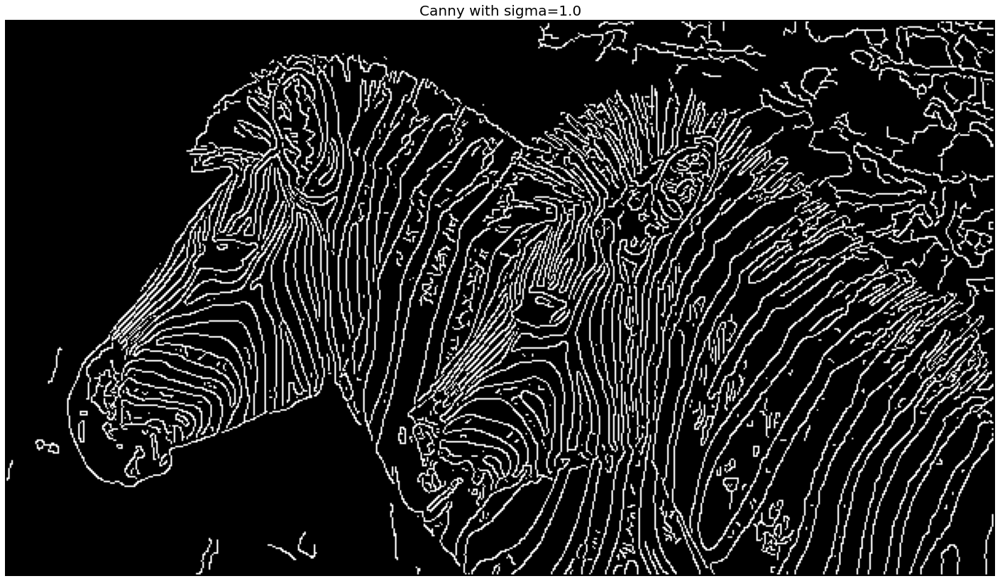

In [19]:
img = rgb2gray(img_as_float(imread('../images/zebras.jpg')))
sigma = 1.0

edges_canny = feature.canny(im)
edges_log = ndimage.gaussian_laplace(img, sigma=sigma)

fig = pylab.figure(figsize=(25,15))

pylab.imshow(np.clip(edges_log,0,1)), pylab.axis('off')
    
pylab.title('LoG with sigma=' + str(sigma), size=20)
pylab.show()

fig = pylab.figure(figsize=(25,15))

pylab.imshow(np.clip(edges_canny,0,1)), pylab.axis('off')
    
pylab.title('Canny with sigma=' + str(sigma), size=20)
pylab.show()


### Finding and enhancing edges with PIL

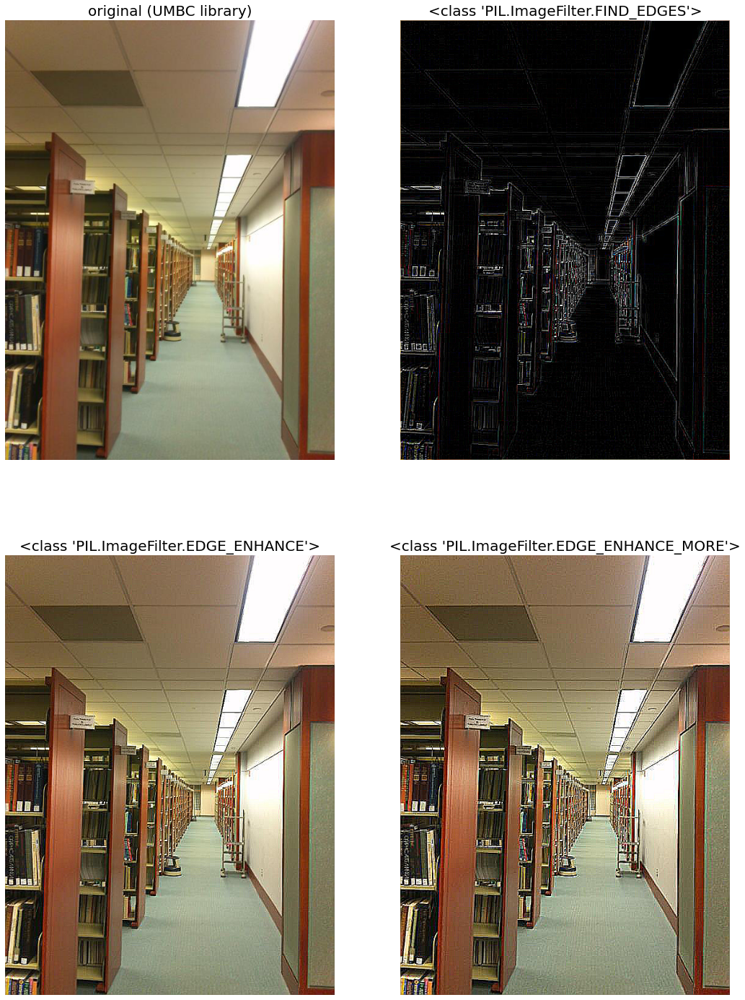

In [34]:
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
im = Image.open('../images/umbc_lib.jpg')
pylab.figure(figsize=(18,25))
pylab.subplot(2,2,1)
plot_image(im, 'original (UMBC library)')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    pylab.subplot(2,2,i)
    im1 = im.filter(f)
    plot_image(im1, str(f))
    i += 1
pylab.show()